# Refining Component 

#### In this notebook, we will go through each component in order to refine them and to have more biological concordant component based on Elli's rules

##### We start with the dataset containing the initial components from the first HDP as well as the new components from second HDP to reassign component 0,2 and 4.
##### We also have the second maximal probability of assignment as well as the second predicted component to help us refining components

In [126]:
library(ggplot2)
library(gridExtra)
library(matrixStats)
library(dplyr)
library(reshape2)
source('../../../src/tools.R')     # custom tools function
source('../../../src/hdp_tools_yanis.R')

In [2]:
df_refine <- read.table("all_components_with_second_complex_inv3.tsv")
df_refine$translated_second_predicted_component <- apply(df_refine, 1, function(x) { if (all(is.na(x['second_predicted_component'])))
                                                                                  return(NaN)
                                                                             else return(ifelse(x['second_predicted_component']==1,"C1",
                                                                                         ifelse(x['second_predicted_component']==3,"C2",
                                                                                         ifelse(x['second_predicted_component']==5,"C3",
                                                                                         ifelse(x['second_predicted_component']==6,"C4",
                                                                                         ifelse(x['second_predicted_component']==7,"C5",
                                                                                         ifelse(x['second_predicted_component']==8,"C6",
                                                                                         ifelse(x['second_predicted_component']==9,"C7",
                                                                                         ifelse(x['second_predicted_component']==10,"C8","others"
                                                                                         )))))))))
                                                                            })
min_proba_c1 = min(df_refine[df_refine$predicted_component=="C1",]$max_proba)
min_proba_c2 = min(df_refine[df_refine$predicted_component=="C2",]$max_proba)
min_proba_c3 = min(df_refine[df_refine$predicted_component=="C3",]$max_proba)
min_proba_c4 = min(df_refine[df_refine$predicted_component=="C4",]$max_proba)
min_proba_c5 = min(df_refine[df_refine$predicted_component=="C5",]$max_proba)
min_proba_c6 = min(df_refine[df_refine$predicted_component=="C6",]$max_proba)
min_proba_c7 = min(df_refine[df_refine$predicted_component=="C7",]$max_proba)
min_proba_c8 = min(df_refine[df_refine$predicted_component=="C8",]$max_proba)

# Takeaways

### [Summary refining Component 1](#summary1)

### [Summary refining Component 2](#summary2)

### [Summary refining Component 3](#summary3)

### [Summary refining Component 4-5](#summary4-5)

### [Summary refining Component 6](#summary6)

### [Summary refining Component 7](#summary7)

### [Summary refining Component 8](#summary8)

### [Summary refining New Components ](#summarynew)

### [Features frequency and activation map for refined components ](#plots)

 # Refining Component 1

In [4]:
study_c1 <- df_refine[df_refine$predicted_component=="C1",]
dim(study_c1)

[1] 851 158

##### Let's look at how many patients have mutations NPM1 within component 1

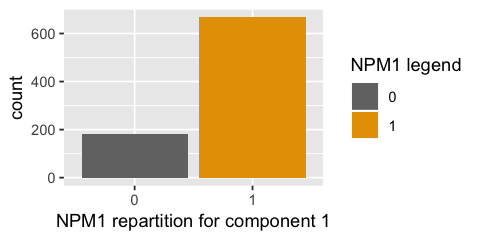

In [5]:
set_notebook_plot_size(4,2)
ggplot(study_c1) +
geom_bar(aes(x = as.factor(NPM1), fill = as.factor(NPM1)), position = "dodge", stat = "count")+
scale_fill_manual(values = c("0" = "grey45", "1" = "#e79f00"))+
xlab("NPM1 repartition for component 1")+guides(fill=guide_legend("NPM1 legend"))


##### Let's try to reassign patients that do not have NPM1 mutation to another component:

##### First, let's look at the repartition of the second predicted component for those patients who are not in initial component 0,2 and 4
##### Others are the ones coming from component 0,2 and 4

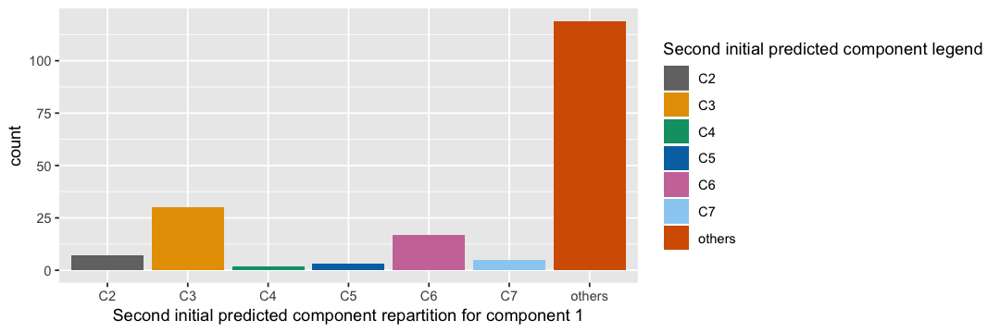

In [6]:
set_notebook_plot_size(9,3)
ggplot(study_c1[study_c1$NPM1==0,]) +
geom_bar(aes(x = as.factor(translated_second_predicted_component), fill = as.factor(translated_second_predicted_component)), position = "dodge", stat = "count")+
scale_fill_manual(values = c("grey45", "#e79f00", "#009E73","#0072B2",  "#CC79A7",
                                      "#9ad0f3", "#D55E00","lightskyblue","mistyrose4", "darkseagreen","lightgoldenrod","lightsalmon","#F0E442","firebrick3","#000000"))+
xlab("Second initial predicted component repartition for component 1")+guides(fill=guide_legend("Second initial predicted component legend"))

##### Unfortunately for those in initial component 0,2 and 4 , we will not be able to reassign them because we have applied an other HDP on those components. Let's look at the others.

##### As we can expect, the probability when NPM1 is 1 is much higher for assignment to component 1. The good news is that when NPM1 is not mutated ,
##### the second max probability is still high so we will define some rules #####to see whether or not we can assign 

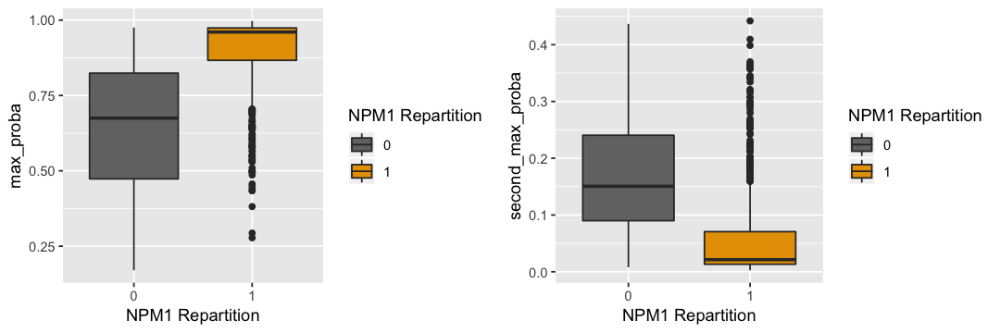

In [7]:
p1 <-ggplot(study_c1,aes(x=factor(NPM1),y=max_proba,fill=factor(NPM1))) +
    geom_boxplot(aes(fill = factor(NPM1)))+scale_fill_manual(values = c("grey45", "#e79f00" ))+guides(fill=guide_legend("NPM1 Repartition"))+
    xlab("NPM1 Repartition")
p2 <-ggplot(study_c1,aes(x=factor(NPM1),y=second_max_proba,fill=factor(NPM1))) +
    geom_boxplot(aes(fill = factor(NPM1)))+scale_fill_manual(values = c("grey45", "#e79f00" ))+guides(fill=guide_legend("NPM1 Repartition"))+
    xlab("NPM1 Repartition")
grid.arrange(p1,p2,nrow=1)

[1] "Number of patients NPM1 wt in component 1 : 183"

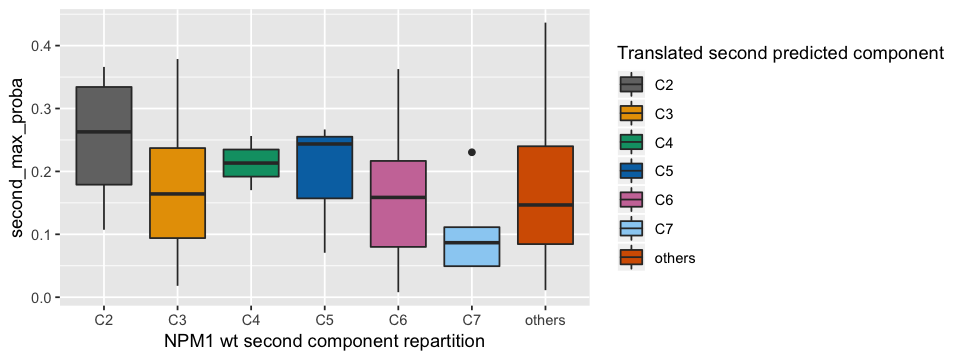

In [8]:
set_notebook_plot_size(8,3)
paste("Number of patients NPM1 wt in component 1 : ",dim(study_c1[study_c1$NPM1==0,])[1],sep="")
ggplot(study_c1[study_c1$NPM1==0,],aes(x=factor(translated_second_predicted_component),y=second_max_proba,fill=factor(translated_second_predicted_component))) +
    geom_boxplot(aes(fill = factor(translated_second_predicted_component)))+scale_fill_manual(values = c("grey45", "#e79f00", "#009E73","#0072B2",  "#CC79A7",
                                      "#9ad0f3", "#D55E00","lightskyblue","mistyrose4", "darkseagreen","lightgoldenrod","lightsalmon","#F0E442","firebrick3","#000000"))+
                                    guides(fill=guide_legend("Translated second predicted component"))+xlab("NPM1 wt second component repartition")

##### For patients in component 1 without NPM1 where second predicted component is 0,2 and 4 , we will not be able to reassign them so we will create a component called : not assigned where we will include them among others.
##### For other patients in component 1 without NPM1, we will assign them to second predicted component if the second max proba is greater than the min(max proba ) of patients that were assigned to this component. 

In [9]:
df_refine$final_component <- "not_assigned"
df_refine[df_refine$predicted_component=="C1" & df_refine$NPM1==1,]$final_component <-"C1"
df_refine[df_refine$predicted_component=="C1" & df_refine$NPM1==0,]$final_component  <- apply(df_refine[df_refine$predicted_component=="C1" & df_refine$NPM1==0,], 1,function(x) {
        if (all(is.na(x['translated_second_predicted_component'])))
            return(NaN)
        else 
            return(ifelse(x['translated_second_predicted_component']=="C2" & x['second_max_proba']>=0.75*min_proba_c2,"C2",
                   ifelse(x['translated_second_predicted_component']=="C3" & x['second_max_proba']>=0.75*min_proba_c3,"C3",
                   ifelse(x['translated_second_predicted_component']=="C4" & x['second_max_proba']>=0.75*min_proba_c4,"C4",
                   ifelse(x['translated_second_predicted_component']=="C5" & x['second_max_proba']>=0.75*min_proba_c5,"C5",
                   ifelse(x['translated_second_predicted_component']=="C6" & x['second_max_proba']>=0.75*min_proba_c6,"C6",
                   ifelse(x['translated_second_predicted_component']=="C7" & x['second_max_proba']>=0.75*min_proba_c7,"C7",
                   ifelse(x['translated_second_predicted_component']=="C8" & x['second_max_proba']>=0.75*min_proba_c8,"C8","not_assigned"))))))))
    })


In [10]:
table(df_refine$NPM1)


   0    1 
1412  682 

### We add all other patients NPM1 mutated (only 14 that are not in C1)

In [11]:
df_refine[df_refine$NPM1==1,]$final_component <- "C1"
table(df_refine$final_component)


          C1           C2           C3           C4           C5           C6 
         682            5           13            1            2            9 
          C7 not_assigned 
           1         1381 

<a id='summary1'></a>
#### Summary Component 1: 
##### We started with 851 patients in component 1 with 668 NPM1 mutated and 183 NPM1 wt .
##### We removed NPM1 wt from component 1 and try to reassign them if probability high enough to there second best component. We were able to reassign 31 out of 183 of them and put the other in a new component called not assigned.
##### We then added all other patients with NPM1 mutations(14 not in component 1 with this mutation in the whole cohort).
##### At the end, we switch from 851 patients in component 1 with: 682 patients in component 1, 31 reassigned between component 2 to 7 and 152 not assigned.
##### They were 2 patients in component 8 with NPM1 that we will remove later from component 1 because they have specific mutations BAGE3 and KMT2C more important.

# Refining Component 2

##### We start by associating final component with C2 for patients in C2 not assigned and will add rules after.

In [12]:
df_refine[df_refine$predicted_component =="C2" & df_refine$final_component =="not_assigned",]$final_component <- "C2"
# There is one patient with NPM1 mutation that we have lost in refining component 1
table(df_refine$final_component)


          C1           C2           C3           C4           C5           C6 
         682          228           13            1            2            9 
          C7 not_assigned 
           1         1158 

In [13]:
study_c2 <- df_refine[df_refine$final_component=="C2",]
dim(study_c2)

[1] 228 159

# 1- Include all cases TP53 and complex:

##### Good news is that there is only one patient with TP53 and complex that is not in component 2 . We will start by adding this patient.

In [14]:
table(df_refine[df_refine$TP53==1 & df_refine$complex==1,]$predicted_component)


 C1  C2  C3  C4  C5  C6  C7  C8 NC1 NC2 NC3 NC4 NC5 NC6 NC7 
  0 143   0   0   0   0   0   0   0   0   1   0   0   0   0 

In [15]:
df_refine[df_refine$TP53==1 & df_refine$complex==1 & df_refine$final_component =="not_assigned",]$final_component <- "C2" 
# we add not assigned to make sure it was not a specific rule like NPM1 mutated needed to be in first component
table(df_refine$final_component)


          C1           C2           C3           C4           C5           C6 
         682          229           13            1            2            9 
          C7 not_assigned 
           1         1157 

# 2- Check cases TP53 wt with plus8 in component 2 in order to reassign them if possible

[1] "Number of patients TP53 wt with plus 8 : 15"

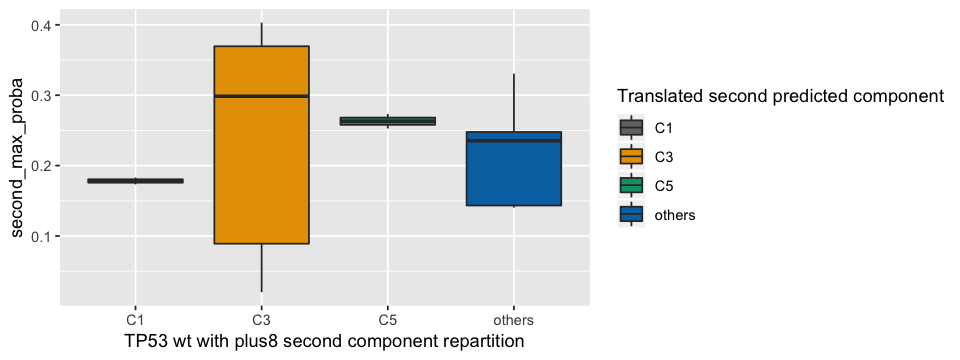

In [16]:
paste("Number of patients TP53 wt with plus 8 : ",dim(study_c2[study_c2$TP53==0 & study_c2$add_8==1,])[1],sep="")
set_notebook_plot_size(8,3)
ggplot(study_c2[study_c2$TP53==0 & study_c2$add_8==1,],aes(x=factor(translated_second_predicted_component),y=second_max_proba,fill=factor(translated_second_predicted_component))) +
    geom_boxplot(aes(fill = factor(translated_second_predicted_component)))+scale_fill_manual(values = c("grey45", "#e79f00", "#009E73","#0072B2",  "#CC79A7",
                                      "#9ad0f3", "#D55E00","lightskyblue","mistyrose4", "darkseagreen","lightgoldenrod","lightsalmon","#F0E442","firebrick3","#000000"))+
                                    guides(fill=guide_legend("Translated second predicted component"))+xlab("TP53 wt with plus8 second component repartition")

#####  Let's try to reassign those cases
We will not consider to reassign in component 1 because we are done with this one.
We have final component initialised with all people in C2 and all people with TP53 and complex mutation. We now remove people TP53 wt with plus8 and try to reassign them

In [17]:
df_refine[df_refine$final_component=="C2" & df_refine$TP53==0 & df_refine$add_8==1,]$final_component  <- apply(df_refine[df_refine$final_component=="C2" & df_refine$TP53==0 & df_refine$add_8==1,], 1,function(x) {
        if (all(is.na(x['translated_second_predicted_component'])))
            return(NaN)
        else 
            return(ifelse(x['translated_second_predicted_component']=="C3" & x['second_max_proba']>=0.75*min_proba_c3,"C3",
                   ifelse(x['translated_second_predicted_component']=="C4" & x['second_max_proba']>=0.75*min_proba_c4,"C4",
                   ifelse(x['translated_second_predicted_component']=="C5" & x['second_max_proba']>=0.75*min_proba_c5,"C5",
                   ifelse(x['translated_second_predicted_component']=="C6" & x['second_max_proba']>=0.75*min_proba_c6,"C6",
                   ifelse(x['translated_second_predicted_component']=="C7" & x['second_max_proba']>=0.75*min_proba_c7,"C7",
                   ifelse(x['translated_second_predicted_component']=="C8" & x['second_max_proba']>=0.75*min_proba_c8,"C8","not_assigned")))))))
    })

In [18]:
table(df_refine$final_component)


          C1           C2           C3           C4           C5           C6 
         682          214           17            1            4            9 
          C7 not_assigned 
           1         1166 

<a id='summary2'></a>
#### Summary Component2:
##### We started with 5 patients coming from reassignement with second predicted component , we added all other patients with predicted second component
##### that were not there yet(223 and we lost one because NPM1 mutated) and we added the only patient not in component 2 with TP53 and complex.
##### At this point it means 229 patients in component 2 and now we need to check that those patients are not TP53 wt combined with plus8. We found 15 of them that we reassigned. 
##### Finally, we have 214 patients in final component 2 .


# 3- Refining Component 3

##### We start by associating final component with C3 for patients in C3 not assigned and will add rules after.
##### Initially, there are 136 with 3 that were reassigned to component 1 because of NPM1 mutation.

In [19]:
df_refine[df_refine$predicted_component =="C3" & df_refine$final_component =="not_assigned",]$final_component <- "C3"

In [20]:
table(df_refine$final_component)


          C1           C2           C3           C4           C5           C6 
         682          214          150            1            4            9 
          C7 not_assigned 
           1         1033 

In [21]:
study_c3 <- df_refine[df_refine$final_component=="C3",]
study_c3$t11 <- pmin(study_c3$t_v_11 + study_c3$t_9_11,1)
study_c3$charac <- ifelse(study_c3$t11==1,"t11",
                         ifelse(study_c3$t_15_17==1,"t15_17","others"))

# 1- We will have to split this component into 3 components: one for t(11) , one for t(15,17), one for others.
##### First, let's look at second predicted component and second max proba repartition for cases without those translations in component 3

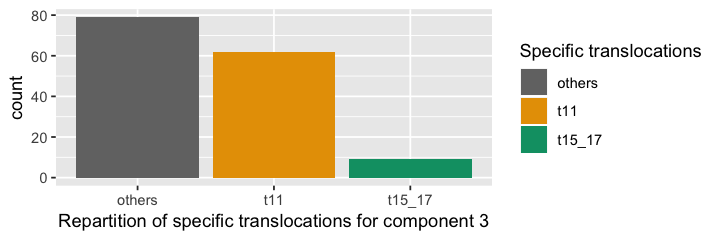

In [22]:
set_notebook_plot_size(6,2)
ggplot(study_c3)+geom_bar(aes(x=factor(charac),fill=factor(charac)),position = "dodge", stat = "count")+
scale_fill_manual(values = c("grey45", "#e79f00", "#009E73"))+
xlab("Repartition of specific translocations for component 3")+guides(fill=guide_legend("Specific translocations"))

### Let's do the split repartition of component 3:

In [23]:
# we start by adding the feature t11 corresponding to wheter or not t_9_11 or t_v_11 is present
df_refine$t11 <- pmin(df_refine$t_v_11 + df_refine$t_9_11,1)
df_refine[df_refine$final_component=="C3",]$final_component <- apply(df_refine[df_refine$final_component=="C3",], 1,function(x) {
        if (all(is.na(x['final_component'])))
            return(NaN)
        else 
            return(ifelse(x['t11']==1,"C3_t11",
                   ifelse(x['t_15_17']==1,"C3_t15_17","C3_others")))
    })

In [24]:
table(df_refine$final_component)


          C1           C2    C3_others       C3_t11    C3_t15_17           C4 
         682          214           79           62            9            1 
          C5           C6           C7 not_assigned 
           4            9            1         1033 

<a id='summary3'></a>
#### Summary Component 3:
##### Initially, 136 patients were assigned to component 3 with 3 of them reassigned to component 1 because NPM1 mutated. 
##### 17 from component 1 and 2 were reassigned to component 3 after refining the first 2 components. So it gives us 150 patients in component 3.
##### After that, we split component 3 into three parts: 62 patients with t11 , 9 with t15_17 and 79(the rest) with others


# 4-5- Refining C4 and C5

##### We will merge those two components into one with all t_8_21 cases and the other one.

In [25]:
df_refine[df_refine$predicted_component =="C4" & df_refine$final_component =="not_assigned",]$final_component <- "C4"
df_refine[df_refine$predicted_component =="C5" & df_refine$final_component =="not_assigned",]$final_component <- "C5"
table(df_refine$final_component)


          C1           C2    C3_others       C3_t11    C3_t15_17           C4 
         682          214           79           62            9           81 
          C5           C6           C7 not_assigned 
          65            9            1          892 

[1] "There are  146 patients total in component 4 and 5"

[1] "with  74 patients in component 4 with t_8_21"

[1] "with  24 patients in component 5 with t_8_21"

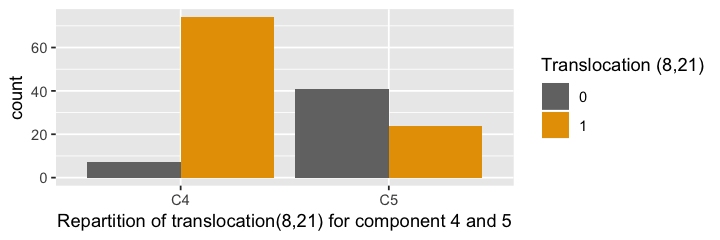

In [26]:
study_c4_5 <- df_refine[df_refine$final_component == "C4" | df_refine$final_component == "C5",]
paste("There are ",dim(study_c4_5)[1],"patients total in component 4 and 5")
paste("with " ,dim(study_c4_5[study_c4_5$final_component=="C4" & study_c4_5$t_8_21==1,])[1],"patients in component 4 with t_8_21")
paste("with " ,dim(study_c4_5[study_c4_5$final_component=="C5" & study_c4_5$t_8_21==1,])[1],"patients in component 5 with t_8_21")
ggplot(study_c4_5)+geom_bar(aes(x=factor(final_component),fill=factor(t_8_21)),position = "dodge", stat = "count")+
scale_fill_manual(values = c("grey45", "#e79f00"))+
xlab("Repartition of translocation(8,21) for component 4 and 5")+guides(fill=guide_legend("Translocation (8,21)"))

#### Let's set up final rule for component 4 and 5 : if translocation(8,21): C4_5_t_8_21 else : C4_5_others

In [27]:
df_refine[df_refine$final_component=="C4" | df_refine$final_component=="C5",]$final_component <- apply(df_refine[df_refine$final_component=="C4" | df_refine$final_component=="C5",], 1,function(x) {
        if (all(is.na(x['final_component'])))
            return(NaN)
        else 
            return(ifelse(x['t_8_21']==1,"C4_5_t_8_21","C4_5_others"))
    })
table(df_refine$final_component)


          C1           C2    C3_others       C3_t11    C3_t15_17  C4_5_others 
         682          214           79           62            9           48 
 C4_5_t_8_21           C6           C7 not_assigned 
          98            9            1          892 

<a id='summary4-5'></a>
##### Summary Component 4-5:
##### We started initially after removing NPM1 mutated cases with 80 in Component 4 and 61 in Component 5 to which we added 1 patient in component 4
##### coming from reassignment and 5 in component 5 coming as well from reassignment.
##### After that, we merged patients in those 2 components with translocation(8,21) to form 2 new components : C4_5 with t(8,21) and C4_5 without.

# 6- Refining C6

#### We will assign all patients in this component with bi allelic CEBPA and try to reassign others.

In [28]:
df_refine[df_refine$predicted_component=="C6" & df_refine$final_component=="not_assigned",]$final_component <- "C6"
table(df_refine$final_component)


          C1           C2    C3_others       C3_t11    C3_t15_17  C4_5_others 
         682          214           79           62            9           48 
 C4_5_t_8_21           C6           C7 not_assigned 
          98           57            1          844 

# Let's first look at the repartition of bi allelic CEBPA within this component.

[1] "There are  57 patients total in component 6"

[1] "with  37 patients in component 6 with bi allelic CEBPA"

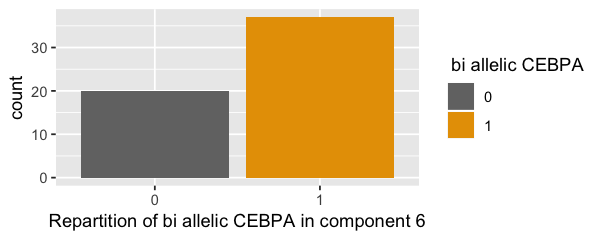

In [33]:
study_c6 <- df_refine[df_refine$final_component=="C6",]
paste("There are ",dim(study_c6)[1],"patients total in component 6")
set_notebook_plot_size(5,2)
paste("with " ,dim(study_c6[study_c6$CEBPA_bi==1,])[1],"patients in component 6 with bi allelic CEBPA")
ggplot(study_c6)+geom_bar(aes(x=factor(CEBPA_bi),fill=factor(CEBPA_bi)),position = "dodge", stat = "count")+
scale_fill_manual(values = c("grey45", "#e79f00"))+
xlab("Repartition of bi allelic CEBPA in component 6")+guides(fill=guide_legend(" bi allelic CEBPA"))

# Let's look at the repartition of the second predicted component for patients in component 6 without bi allelic CEBPA

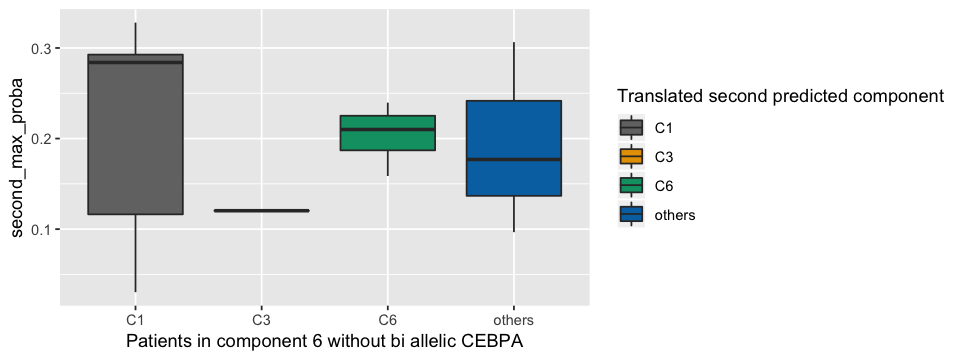

In [57]:
set_notebook_plot_size(8,3)
ggplot(study_c6[study_c6$CEBPA_bi==0,],aes(x=factor(translated_second_predicted_component),y=second_max_proba,fill=factor(translated_second_predicted_component))) +
    geom_boxplot(aes(fill = factor(translated_second_predicted_component)))+scale_fill_manual(values = c("grey45", "#e79f00", "#009E73","#0072B2",  "#CC79A7",
                                      "#9ad0f3", "#D55E00","lightskyblue","mistyrose4", "darkseagreen","lightgoldenrod","lightsalmon","#F0E442","firebrick3","#000000"))+
                                    guides(fill=guide_legend("Translated second predicted component"))+xlab("Patients in component 6 without bi allelic CEBPA")

##### They will all go to the not_assigned component because we have already reassigned all patients in Component 1. For component 3, the patient do not have any of the translocation 11 nor 15,17 and there are some that 
##### are predicted into component 6 because they were already reassigned to this component so it is their second predicted component. For others, it is an other clustering so we can not reassign them.

In [55]:
df_refine[df_refine$final_component=="C6",]$final_component <- apply(df_refine[df_refine$final_component=="C6",], 1,function(x) {
        if (all(is.na(x['final_component'])))
            return(NaN)
        else 
            return(ifelse(x['CEBPA_bi']==1,"C6","not_assigned"))
    })

In [56]:
table(df_refine$final_component)


          C1           C2    C3_others       C3_t11    C3_t15_17  C4_5_others 
         682          214           79           62            9           48 
 C4_5_t_8_21           C6           C7 not_assigned 
          98           37            1          864 

<a id='summary6'></a>
#### Summary Component 6 :
##### We have kept people that were initially assigned to this component as well as the ones that were reassigned with their second predicted component only with bi allelic CEBPA.
##### There are 37 patients in component 6 with bi alllelic CEBPA . The others (20 patients) are put in component not assigned.

# 7- Refining C7

##### For this component , we will follow the WHO classification for inv3 and mark all patients in this component with inv3 and try to reassign the others

#### Let's first look at the repartition of inv3 within this component and after look at the repartition of the second predicted component for patients initially in this component without without inv3

In [73]:
df_refine[df_refine$predicted_component=="C7",]$final_component <- "C7"
table(df_refine$final_component)


          C1           C2    C3_others       C3_t11    C3_t15_17  C4_5_others 
         682          214           79           62            9           48 
 C4_5_t_8_21           C6           C7 not_assigned 
          98           37           28          837 

[1] "There are  28 patients total in component 7"

[1] "with  8 patients in component 7 with inv3"

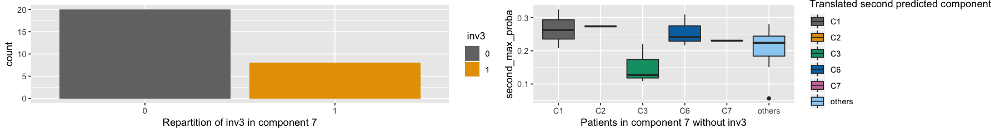

In [78]:
study_c7 <- df_refine[df_refine$final_component=="C7",]
set_notebook_plot_size(15,2)
paste("There are ",dim(study_c7)[1],"patients total in component 7")
paste("with " ,dim(study_c7[study_c7$inv_3==1,])[1],"patients in component 7 with inv3")
p1 <- ggplot(study_c7)+geom_bar(aes(x=factor(inv_3),fill=factor(inv_3)),position = "dodge", stat = "count")+
scale_fill_manual(values = c("grey45", "#e79f00"))+
xlab("Repartition of inv3 in component 7")+guides(fill=guide_legend(" inv3"))
p2 <- ggplot(study_c7[study_c7$inv_3==0,],aes(x=factor(translated_second_predicted_component),y=second_max_proba,fill=factor(translated_second_predicted_component))) +
    geom_boxplot(aes(fill = factor(translated_second_predicted_component)))+scale_fill_manual(values = c("grey45", "#e79f00", "#009E73","#0072B2",  "#CC79A7",
                                      "#9ad0f3", "#D55E00","lightskyblue","mistyrose4", "darkseagreen","lightgoldenrod","lightsalmon","#F0E442","firebrick3","#000000"))+
                                    guides(fill=guide_legend("Translated second predicted component"))+xlab("Patients in component 7 without inv3")
grid.arrange(p1,p2,nrow=1)

#### Let's reassign the ones without inv3 keeping in mind those rules:
#### -it is not possible in C1 
#### -we separated based on the translocations in component 3  (t11,15_17,others)
#### -we need bi allelic CEBPA to reassign to component 6

In [81]:
df_refine[df_refine$final_component=="C7" & df_refine$inv_3==0,]$final_component  <- apply(df_refine[df_refine$final_component=="C7" & df_refine$inv_3==0,], 1,function(x) {
        if (all(is.na(x['translated_second_predicted_component'])))
            return(NaN)
        else 
            return(ifelse(x['translated_second_predicted_component']=="C2" & x['second_max_proba']>=0.75*min_proba_c2,"C2",
                   ifelse(x['translated_second_predicted_component']=="C3" & x['second_max_proba']>=0.75*min_proba_c3 & x['t11']==1,"C3_t11",
                   ifelse(x['translated_second_predicted_component']=="C3" & x['second_max_proba']>=0.75*min_proba_c3 & x['t_15_17']==1,"C3_t15_17",
                   ifelse(x['translated_second_predicted_component']=="C3" & x['second_max_proba']>=0.75*min_proba_c3 & x['t11']==0 & x['t_15_17']==0,"C3_others",       
                   ifelse(x['translated_second_predicted_component']=="C6" & x['second_max_proba']>=0.75*min_proba_c6 & x['CEBPA_bi']==1,"C6","not_assigned"))))))
    })


In [82]:
table(df_refine$final_component)


          C1           C2    C3_others       C3_t11    C3_t15_17  C4_5_others 
         682          215           80           62            9           48 
 C4_5_t_8_21           C6           C7 not_assigned 
          98           37            8          855 

<a id='summary7'></a>
#### Summary Component 7: 
##### In component 7, we have kept patients with inv3 (8 patients) and reassigned the 20 other patients if it was possible keeping in mind the specific rules established previously.

# 8- Component 8

In [84]:
df_refine[df_refine$predicted_component =="C8",c("BAGE3","KMT2C")]

,BAGE3,KMT2C
PD20112a,1,1
PD22660a,1,1
PD22943a,1,1
PD23112c,1,1
PD23136a,1,1
PD25061a,1,1
PD25160c,1,1
PD25295c,1,1


In [85]:
df_refine[df_refine$predicted_component =="C8",]$final_component <- "C8"

In [86]:
table(df_refine$final_component)


          C1           C2    C3_others       C3_t11    C3_t15_17  C4_5_others 
         680          215           80           62            9           48 
 C4_5_t_8_21           C6           C7           C8 not_assigned 
          98           37            8            8          849 

<a id='summary8'></a>
#### Summary Component 8: 
##### This component is clearly firing for mutations BAGE 3 and KMT2C activated together for all patients and all the patients with those 2 mutations are in this component so we do not touch component 8

# 9- New Components 1 to 7

In [89]:
df_refine[df_refine$predicted_component=="NC1" & df_refine$final_component=="not_assigned",]$final_component <- "NC1"
df_refine[df_refine$predicted_component=="NC2" & df_refine$final_component=="not_assigned",]$final_component <- "NC2"
df_refine[df_refine$predicted_component=="NC3" & df_refine$final_component=="not_assigned",]$final_component <- "NC3"
df_refine[df_refine$predicted_component=="NC4" & df_refine$final_component=="not_assigned",]$final_component <- "NC4"
df_refine[df_refine$predicted_component=="NC5" & df_refine$final_component=="not_assigned",]$final_component <- "NC5"
df_refine[df_refine$predicted_component=="NC6" & df_refine$final_component=="not_assigned",]$final_component <- "NC6"
df_refine[df_refine$predicted_component=="NC7" & df_refine$final_component=="not_assigned",]$final_component <- "NC7"

<a id='summarynew'></a>
#### Summary New Components:
##### For the remaining components , we just assign them the way it was because those components have multiple contributors.
##### In the analysis of the refined components, we will go through their contributors.

## Summary all refined components:
##### For the initial component, we have refined them based on biological content as well as second predicted component .
##### Regarding the new components, we have kept the algorithm 's assignment because more complex contributors are involved and therefore the separation based on a single on or two contributors is not possible.

# Let's look at feature activation for the new component definitions:

<a id='plots'></a>

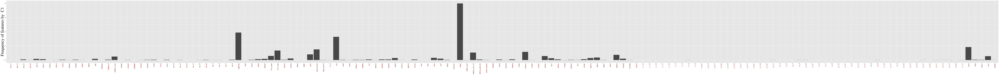

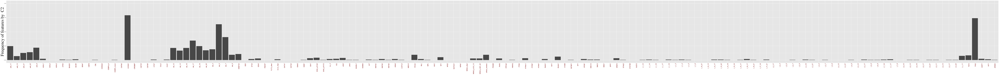

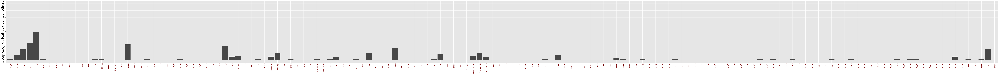

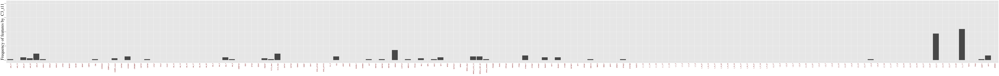

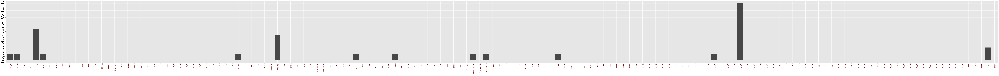

...

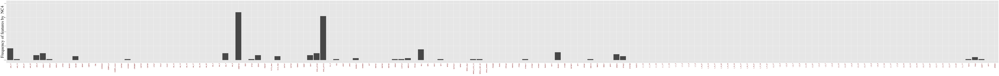

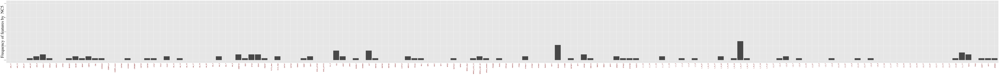

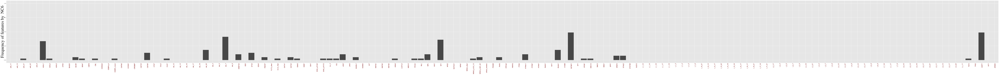

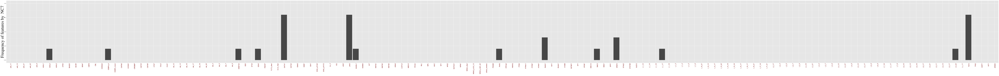

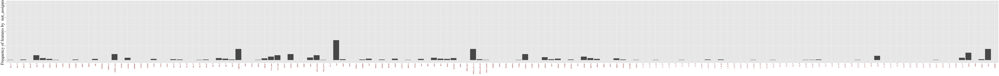

In [120]:
cols_to_keep = c(1:150,155,156,161)
tmp_cat <- as.data.frame(sapply(df_refine[,cols_to_keep], as.numeric))
categories_repartition <- data.frame(category = colnames(tmp_cat))
for (i in 1:18)
    categories_repartition[sprintf('component_%d', i)] <- apply(categories_repartition, 1, function(s) (sum(tmp_cat[tmp_cat$final_component_numeric == i, s['category']])/nrow(tmp_cat[tmp_cat$final_component_numeric ==i,])))
categories_repartition <- categories_repartition[! categories_repartition$category == "final_component_numeric",]
set_notebook_plot_size(130,10)
i <-1
for (col in colnames(categories_repartition)[-1]){
    plot(ggplot(categories_repartition,aes(factor(category),y=categories_repartition[,col]))+geom_bar(stat='identity')+xlab("")+scale_fill_manual(values="#e79f00")
     +ylab(paste("Frequency of features by ",levels(factor(df_refine$final_component))[i]))+theme(axis.text.x = element_text(angle = 90, hjust = 1, size=13,color="darkred"))
     +theme(axis.title.y = element_text(family="serif", size = 40, angle = 90, vjust = 0.25))+ylim(0,1))
    i <-i+1
    }

In [135]:
df_all_components <- df_refine[,cols_to_keep]
tmp_all <- df_all_components[order(df_all_components$final_component_numeric),]
transp_df_all <-(as.data.frame(t(tmp_all)))
transp_df_all$features <- rownames(transp_df_all)
transp_df_all <- transp_df_all[! row.names(transp_df_all) == "final_component_numeric",]
melt.data_all<-melt(transp_df_all,id.vars ="features", variable_name=colnames(transp_df_all))

Warning message:
“attributes are not identical across measure variables; they will be dropped”

[1] "Order of Components :"


[1] "C1"           "C2"           "C3_others"    "C3_t11"       "C3_t15_17"   
 [6] "C4_5_others"  "C4_5_t_8_21"  "C6"           "C7"           "C8"          
[11] "NC1"          "NC2"          "NC3"          "NC4"          "NC5"         
[16] "NC6"          "NC7"          "not_assigned"

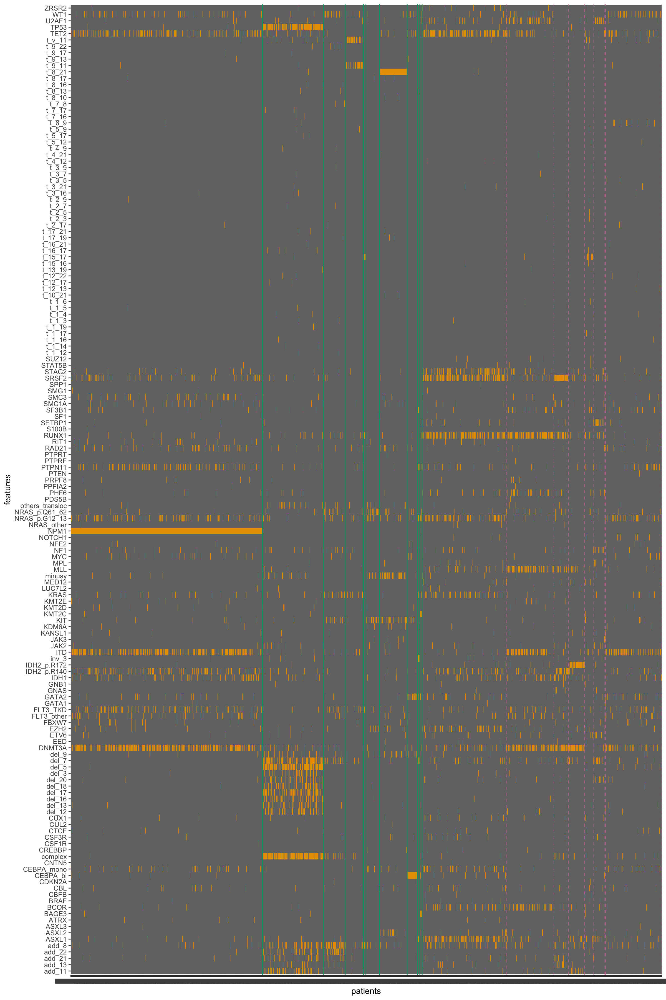

In [144]:
options(repr.plot.res = 200)
set_notebook_plot_size(12, 18)
col_sep <- tabulate(df_all_components$final_component_numeric)   ## to separate by component
print ("Order of Components :")
levels(factor(df_refine$final_component))
# plot the heatmap
ggplot(melt.data_all, aes(variable,features)) +
geom_raster(aes(fill = factor(value)), show.legend = FALSE) +
scale_fill_manual(values = c("0" = "grey45", "1" = "#e79f00")) +
geom_vline(xintercept = cumsum(col_sep)[1:10] + 0.5, col = "#009E73", linetype = 1, size = 0.5) +
geom_vline(xintercept = cumsum(col_sep)[11:18] + 0.5, col = "#CC79A7", linetype = 2, size = 0.3) +
labs(x = 'patients') 